# Create your dataset

1) Choose which classes you would like to add.

2) Create a dataset with your own photos

3) Separate your dataset into train and test subsets.

Dataset : https://www.kaggle.com/datasets/niteshfre/chessman-image-dataset

In [2]:
import os
import pandas as pd
from glob import glob

def create_dataframe_from_directories(path):
    data = []

    for label_dir in os.listdir(path):
        if os.path.isfile(label_dir):
            continue

        label_path_path = os.path.join(path, label_dir)
        for file in os.listdir(label_path_path):
            data.append([os.path.join(label_path_path, file), label_dir])
        
    return pd.DataFrame(data, columns = ["path", "label"])

In [3]:
train_df = create_dataframe_from_directories("dataset_train")
test_df = create_dataframe_from_directories("dataset_test")

In [4]:
LABEL_NAMES = pd.unique(train_df['label'])
LABEL_NAMES

array(['Rook', 'Bishop', 'Knight', 'Queen', 'King', 'Pawn'], dtype=object)

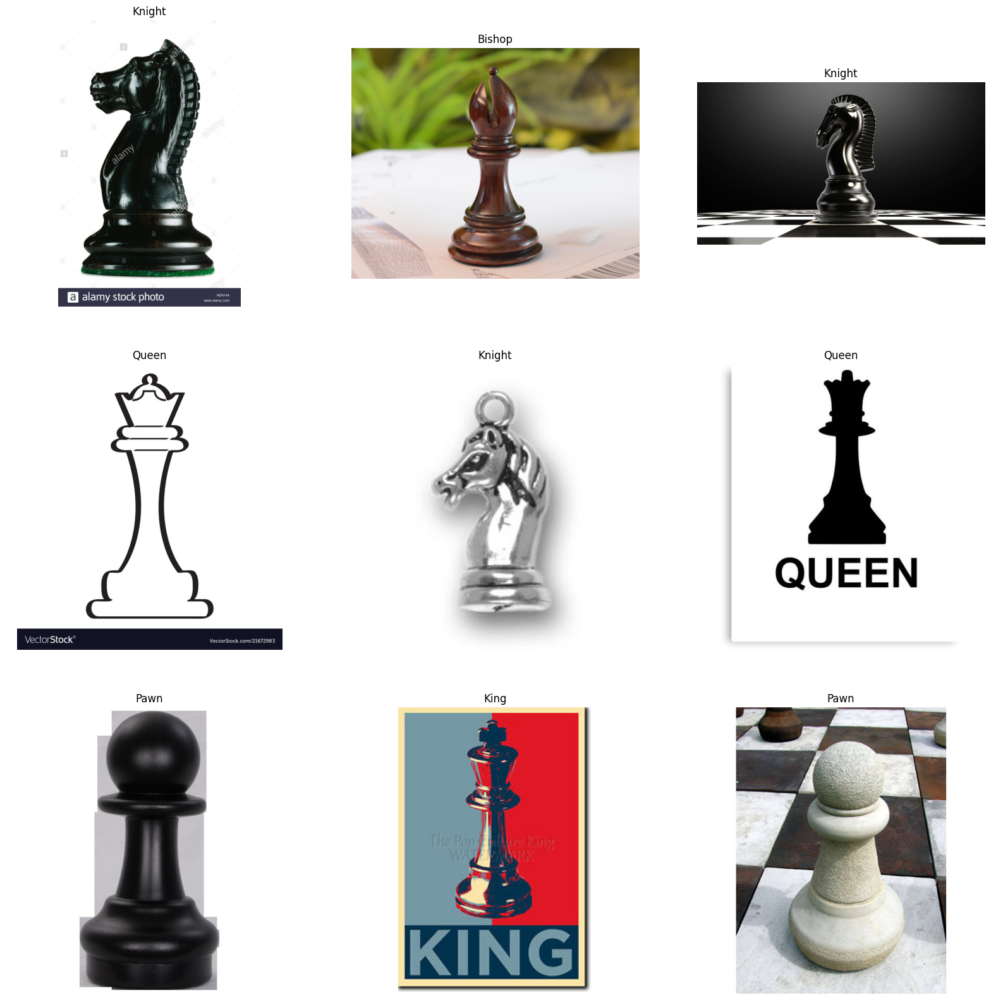

In [5]:
import matplotlib.pyplot as plt
import PIL
import PIL.Image

plt.figure(figsize=(20, 20))

i = 0
for _, rowdata in train_df.sample(frac=1).head(9).iterrows():
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(PIL.Image.open(rowdata.path))
    plt.title(rowdata.label)
    plt.axis("off")
    i += 1

# Explore your dataset

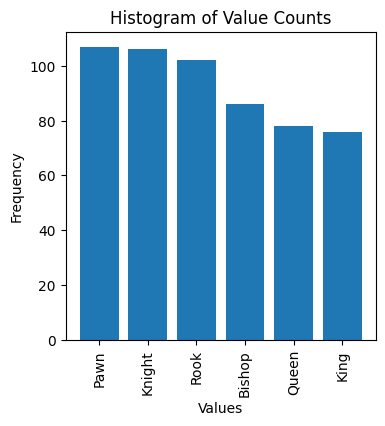

In [6]:


value_counts = train_df.value_counts("label")

# Plotting the histogram
plt.figure(figsize=(4, 4))  # Set the size of the figure

# Plot the histogram using the 'bar' plot in matplotlib
plt.bar(value_counts.index, value_counts.values)

plt.xlabel('Values')  # Set the label for the x-axis
plt.ylabel('Frequency')  # Set the label for the y-axis
plt.title('Histogram of Value Counts')  # Set the title of the histogram

plt.xticks(rotation=90)  # Rotate x-axis labels for better readability if needed

plt.show()

# Preprocessing steps

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


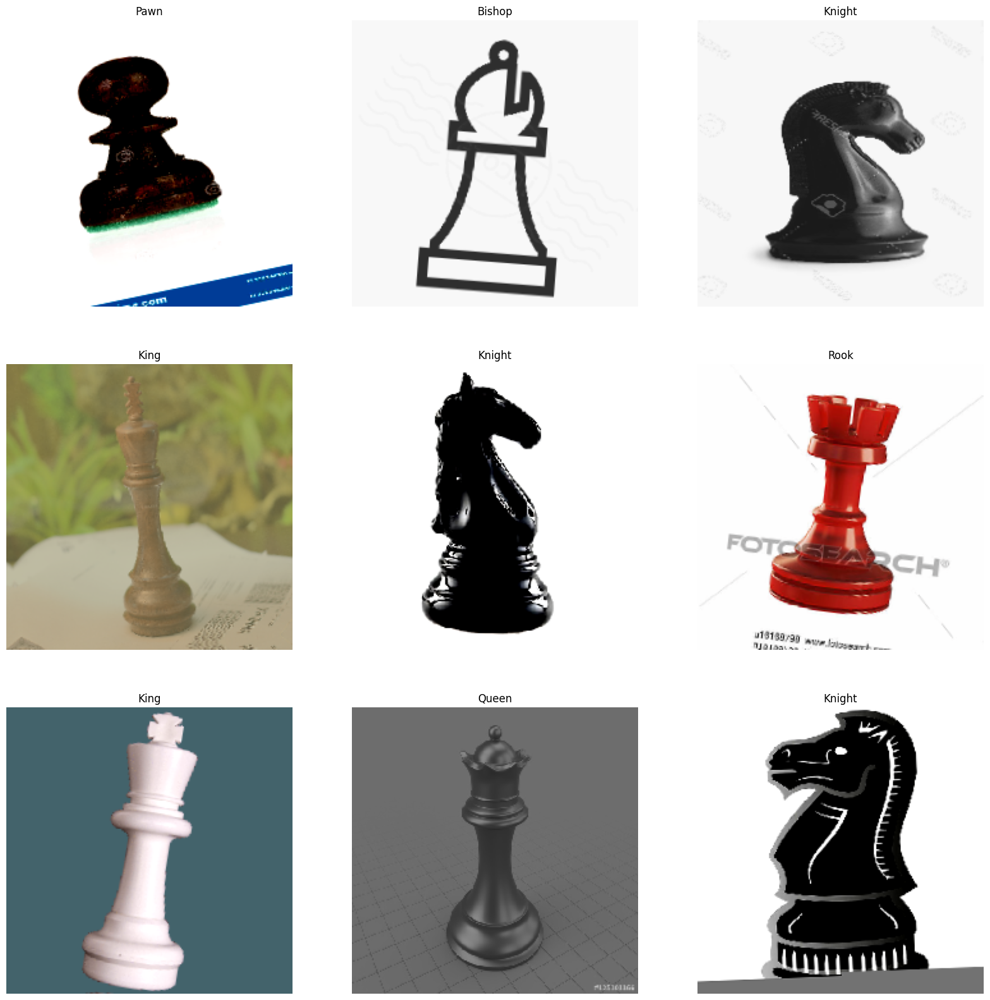

In [7]:
import tensorflow.keras.layers  as tf_layers
import numpy as np
from tensorflow.keras import Sequential

IMG_HEIGHT = 224
IMG_WIDTH = 224

image_preprocesses = Sequential([
    tf_layers.Resizing(IMG_HEIGHT, IMG_WIDTH,"nearest"),
    tf_layers.Rescaling(1. / 255)
])

image_augmentations = Sequential([
    # TODO: choose some image augmentations layers
    # see which keras layers you can use
    # The kind of layers you will want to use starts with "Random".
    # See the following page for more information on data augmentation :
    # https://www.tensorflow.org/tutorials/images/data_augmentation

    tf_layers.RandomFlip(mode= "horizontal"),
    tf_layers.RandomRotation(0.04),
    tf_layers.RandomContrast(0.9)
])

def open_images(paths):
    return np.stack([
        open_image(path) for path in paths
    ])

def open_image(path):
    with PIL.Image.open(path) as image:
        opened_img = image_preprocesses(np.asarray(image))
    
    return opened_img

def augment_images(images):
    return np.stack([
        image_augmentations(img) for img in images
    ])


# Plotting images 

plt.figure(figsize=(20, 20))

i = 0
for _, rowdata in train_df.sample(frac=1).head(9).iterrows():
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image_augmentations(open_image(rowdata.path)))
    plt.title(rowdata.label)
    plt.axis("off")
    i += 1

## Define model

In [8]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras import Model
from tensorflow.keras.layers import (
    GlobalAveragePooling2D,
    Dense,
    Dropout,
    BatchNormalization,
    Flatten
)

def get_model():
    base_model = MobileNetV2(
        input_shape=(224, 224, 3),
        weights='imagenet',
        include_top=False
    )
    
    layers = base_model.output

    added_layers = [
        # important, we need global average pooling instead of flatten for class activation map later on 
        Flatten(),
        Dropout(0.4),
        Dense(36,activation='relu'),
        Dense(len(LABEL_NAMES),  activation='softmax'),
    ]

    model = Model(inputs=base_model.input, outputs=Sequential(added_layers)(layers))

    # freeze layers
    for layer in base_model.layers:
        layer.trainable = False
    
    model.compile(
      optimizer = RMSprop(),
      loss = SparseCategoricalCrossentropy(),
      metrics = ['acc']
    )
        
    return model



In [9]:
get_model().summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

# Model training

**TODO**: cross-validate your model, you can base yourself on the code from the first part of this practical work

**NOTE**: you shouldn't augment validations images. What we want to evaluate is the performances on "real" images, not on images that are augmented and change all the time 

In [10]:
import numpy as np
import tensorflow as tf
from sklearn.model_selection import KFold
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

def open_images_train(paths):
    images = []
    for path in paths:
        with PIL.Image.open(path) as image:
            images.append(image_augmentations(image_preprocesses(np.asarray(image))))
            
    return np.array(images)

def open_images_val(paths):
    images = []
    for path in paths:
        with PIL.Image.open(path) as image:
            images.append(image_augmentations(image_preprocesses(np.asarray(image))))
            
    return np.array(images)


shuffled_dataset = train_df.sample(frac=1, random_state=1234).reset_index(drop=True)

dataset_paths = shuffled_dataset['path'].to_numpy()
dataset_labels = shuffled_dataset['label'].to_numpy()

shuffled_dataset = test_df.sample(frac=1, random_state=1234).reset_index(drop=True)

verif_paths = shuffled_dataset['path'].to_numpy()
verif_labels = shuffled_dataset['label'].to_numpy()

total_train_paths, test_paths, total_train_labels, test_labels = train_test_split(
    dataset_paths, dataset_labels, test_size=0.2, random_state=1234
)

# We need to convert from string labels to integers
label_encoder = LabelEncoder()
label_encoder.fit(LABEL_NAMES)
total_train_labels = label_encoder.transform(total_train_labels)
test_labels = label_encoder.transform(test_labels)
verif_labels = label_encoder.transform(verif_labels)
label_decoder = label_encoder.classes_
NB_EPOCHS = 12

train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

for train_index, val_index in KFold(n_splits=5).split(total_train_paths, total_train_labels):
    train_images = open_images_train(total_train_paths[train_index])    
    train_labels = total_train_labels[train_index]
    
    val_images = open_images_val(total_train_paths[val_index])
    val_labels = total_train_labels[val_index]
    
    model = get_model() # We reinitialize the model
    
    history = model.fit(
        x=train_images,
        y=train_labels,
        batch_size=8,
        validation_data=[val_images, val_labels],
        epochs=NB_EPOCHS,
    )
    
    train_losses.append(history.history['loss'])
    val_losses.append(history.history['val_loss'])
    train_accuracies.append(history.history['acc'])
    val_accuracies.append(history.history['val_acc'])

Epoch 1/12
45/45 [==============================] - 6s 102ms/step - loss: 4.9839 - acc: 0.2761 - val_loss: 2.2370 - val_acc: 0.4944
Epoch 2/12
45/45 [==============================] - 4s 84ms/step - loss: 1.5232 - acc: 0.5352 - val_loss: 1.0860 - val_acc: 0.6067
Epoch 3/12
45/45 [==============================] - 4s 85ms/step - loss: 0.8208 - acc: 0.7070 - val_loss: 1.0672 - val_acc: 0.5618
Epoch 4/12
45/45 [==============================] - 4s 84ms/step - loss: 0.6290 - acc: 0.8225 - val_loss: 1.4332 - val_acc: 0.6292
Epoch 5/12
45/45 [==============================] - 4s 85ms/step - loss: 0.3959 - acc: 0.8817 - val_loss: 1.1982 - val_acc: 0.6854
Epoch 6/12
45/45 [==============================] - 4s 86ms/step - loss: 0.2248 - acc: 0.9380 - val_loss: 1.4936 - val_acc: 0.7079
Epoch 7/12
45/45 [==============================] - 5s 109ms/step - loss: 0.1535 - acc: 0.9380 - val_loss: 1.3820 - val_acc: 0.6966
Epoch 8/12
45/45 [==============================] - 6s 135ms/step - loss: 0.0928 

# Results

**TODO**: plot the results from your crossvalidation

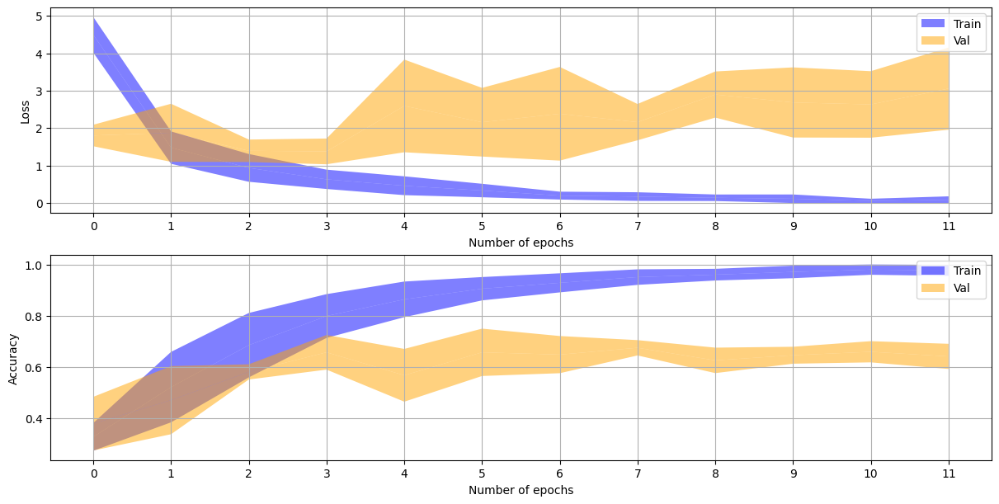

In [11]:
def plot_kfold_mean_performance(ax, train_performances, val_performances, measure_name):
    train_mean = np.mean(train_performances, axis=0)
    val_mean = np.mean(val_performances, axis=0)
    train_sd = np.std(train_performances, axis=0)
    val_sd = np.std(val_performances, axis=0)
    
    ax.fill_between(np.arange(NB_EPOCHS), train_mean, train_mean+train_sd, facecolor='blue', alpha=0.5, label='Train')
    ax.fill_between(np.arange(NB_EPOCHS), train_mean, train_mean-train_sd, facecolor='blue', alpha=0.5)

    ax.fill_between(np.arange(NB_EPOCHS), val_mean, val_mean+val_sd, facecolor='orange', alpha=0.5, label='Val')
    ax.fill_between(np.arange(NB_EPOCHS), val_mean, val_mean-val_sd, facecolor='orange', alpha=0.5)

    ax.set_xticks(np.arange(NB_EPOCHS))

    ax.set_ylabel(measure_name)
    ax.set_xlabel('Number of epochs')
    #pl.title(str(K)+'-fold CV with '+str(n)+' hidden neurons')
    ax.legend()
    ax.grid()

    
fig, axs = plt.subplots(2, 1, constrained_layout=True, figsize=(12,6))

plot_kfold_mean_performance(axs[0], train_losses, val_losses, "Loss")
plot_kfold_mean_performance(axs[1], train_accuracies, val_accuracies, "Accuracy")

## Evaluate model on test set

4/4 [==============================] - 2s 243ms/step


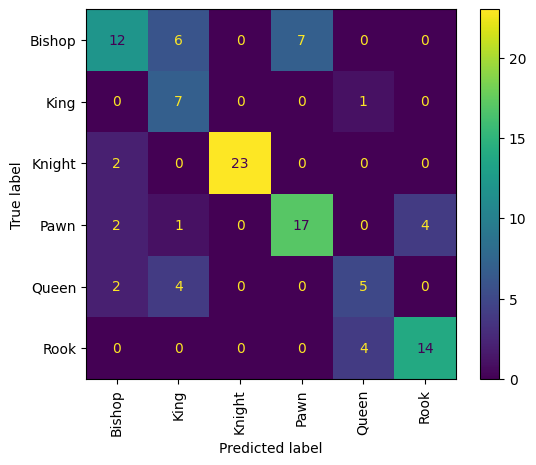

F-score Bishop: 0.5581395348837209
F-score King: 0.5384615384615385
F-score Knight: 0.9583333333333334
F-score Pawn: 0.7083333333333334
F-score Queen: 0.47619047619047616
F-score Rook: 0.7777777777777778


In [12]:
import sklearn.metrics as me

def compute_fscore(matrix, c):
    selector = [x for x in range(matrix.shape[1]) if x != c]
    tp = matrix[c,c]
    fp = np.sum(matrix[selector,c])
    fn = np.sum(matrix[c,selector])
    if (tp == 0 or tp + fp == 0 or tp + fn == 0): return 0
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    return 2 * precision * recall / (precision + recall)

test_images = open_images(test_paths)    

pred = model.predict(test_images)
pred = np.argmax(pred, axis=-1)

test_confusion_matrix = me.confusion_matrix(test_labels, pred, labels=np.arange(len(LABEL_NAMES)))

confusion_matrix_display = me.ConfusionMatrixDisplay(
    confusion_matrix=test_confusion_matrix,
    display_labels=label_decoder,
)

confusion_matrix_display.plot(xticks_rotation='vertical')
plt.show()

for i in range(len(LABEL_NAMES)):
        print(f"F-score {label_decoder[i]}: {compute_fscore(test_confusion_matrix, i)}")

1/1 [==============================] - 0s 239ms/step


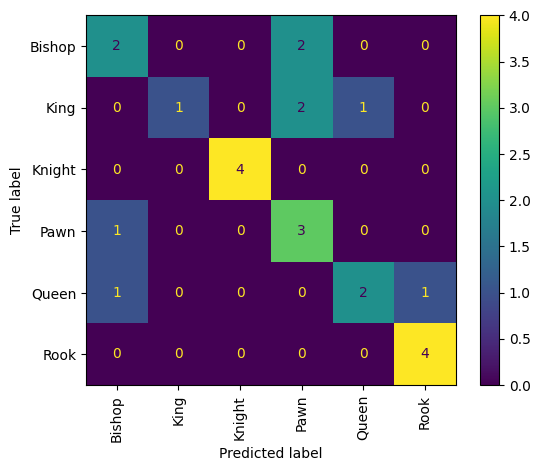

F-score Bishop: 0.5
F-score King: 0.4
F-score Knight: 1.0
F-score Pawn: 0.5454545454545454
F-score Queen: 0.5714285714285715
F-score Rook: 0.888888888888889


In [13]:
## Evaluate our photo
verif_images = open_images(verif_paths)    

verif_pred = model.predict(verif_images)
verif_pred = np.argmax(verif_pred, axis=-1)

verif_confusion_matrix = me.confusion_matrix(verif_labels, verif_pred, labels=np.arange(len(LABEL_NAMES)))

verif_confusion_matrix_display = me.ConfusionMatrixDisplay(
    confusion_matrix=verif_confusion_matrix,
    display_labels=label_decoder,
)

verif_confusion_matrix_display.plot(xticks_rotation='vertical')
plt.show()

for i in range(len(LABEL_NAMES)):
        print(f"F-score {label_decoder[i]}: {compute_fscore(verif_confusion_matrix, i)}")

### Display some misclassified images

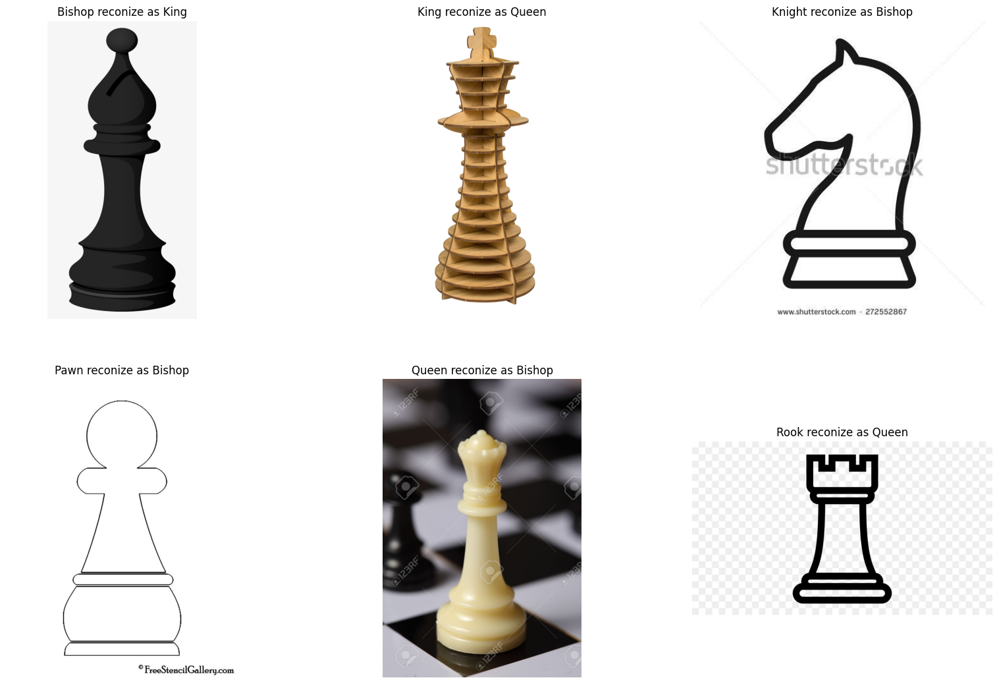

In [14]:


plt.figure(figsize=(20, 20))

# display(pred)
# display(test_labels_final)
i = 0
for x in range(len(label_decoder)):
    for i in range(len(test_paths)):
        if(test_labels[i] == x):
            if(x != pred[i]):
                ax = plt.subplot(3, 3, x +1)
                plt.imshow(PIL.Image.open(test_paths[i]))
                plt.title(f"{label_decoder[test_labels[i]]} reconize as {label_decoder[pred[i]]}")
                plt.axis("off")
                break



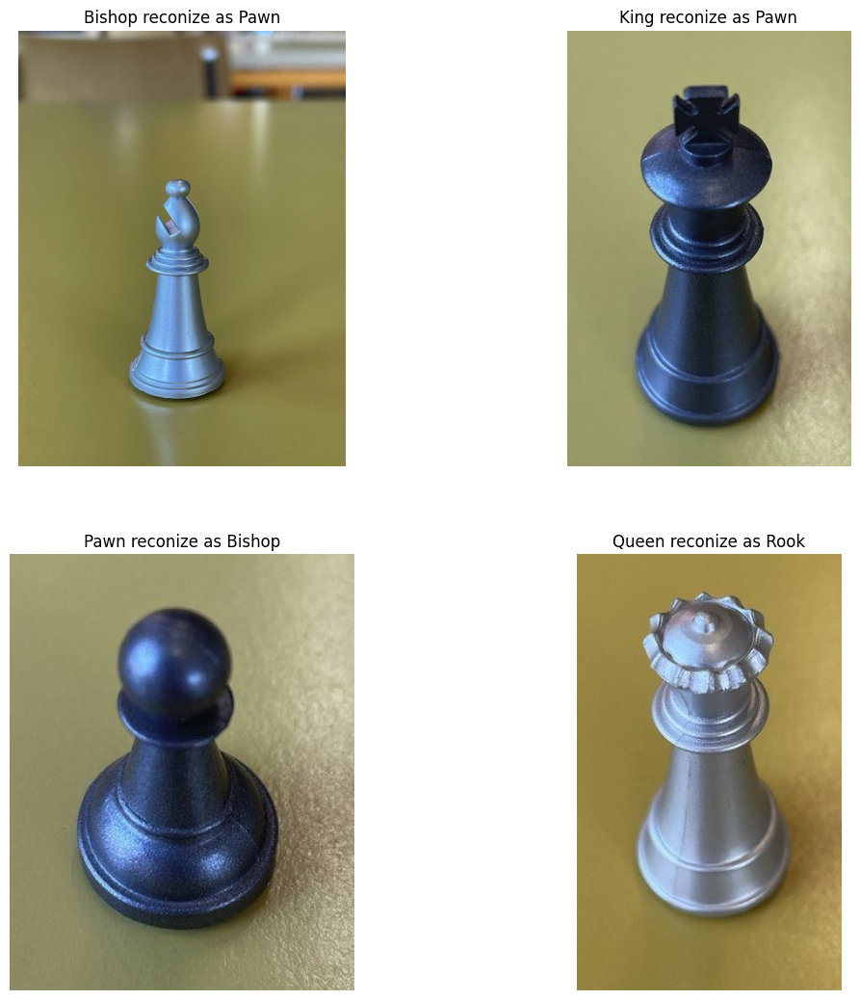

In [15]:
plt.figure(figsize=(20, 20))

# display(pred)
# display(test_labels_final)
i = 0
for x in range(len(label_decoder)):
    for i in range(len(verif_paths)):
        if(verif_labels[i] == x):
            if(x != verif_pred[i]):
                ax = plt.subplot(3, 3, x +1)
                plt.imshow(PIL.Image.open(verif_paths[i]))
                plt.title(f"{label_decoder[verif_labels[i]]} reconize as {label_decoder[verif_pred[i]]}")
                plt.axis("off")
                break

## Use grad-cam to inspect how the model classify
Here we can see an heatmap of the regions that activates the model the most.

### For more information:
- tf-keras-vis documentation: https://keisen.github.io/tf-keras-vis-docs/
- Grad-cam paper: https://arxiv.org/pdf/1610.02391.pdf
- Grad-cam++ paper: https://arxiv.org/pdf/1710.11063.pdf

**NOTE**: maybe you will need to adapt some variable names based on your code above. For example, _model_ should be the model trained on all the training data. 

Note: you may need to restart the kernel to use updated packages.


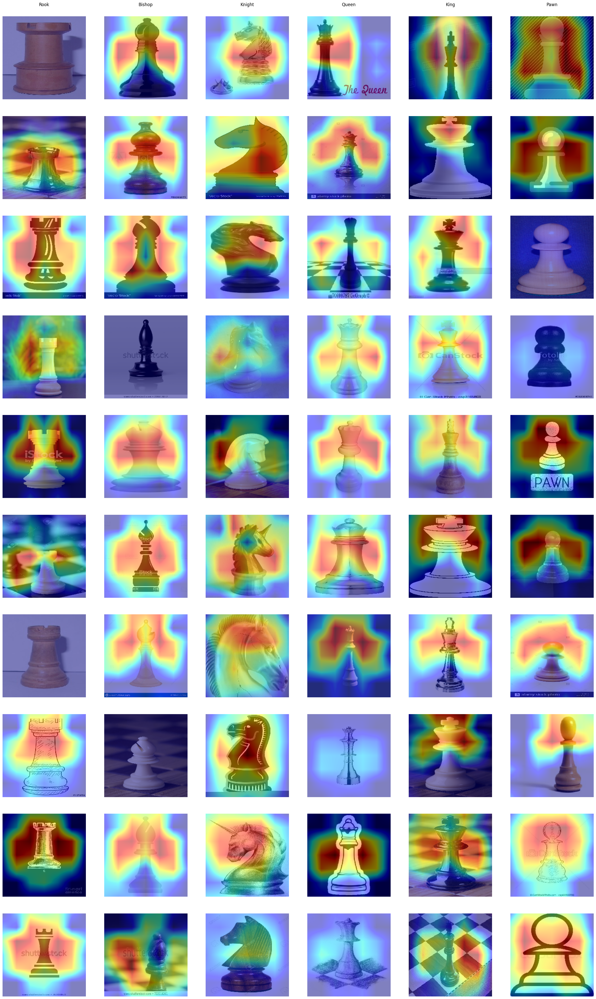

In [16]:
%pip install tf-keras-vis tensorflow
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from tensorflow.keras.applications import MobileNetV2
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

# Create GradCAM++ object
gradcam = GradcamPlusPlus(
    model,
    model_modifier=ReplaceToLinear(),
    clone=True,
)

nb_images_per_class = 10

fig, axs = plt.subplots(nb_images_per_class, len(LABEL_NAMES), figsize=(len(LABEL_NAMES) * 5, nb_images_per_class * 5))

for label_idx, label_name in enumerate(LABEL_NAMES):
    axs[0,label_idx].set_title(label_name, loc='center', y=1.1)
    
    i = 0
    for _, rowdata in train_df[train_df['label'] == label_name].sample(frac=1).head(nb_images_per_class).iterrows():
        img = open_image(rowdata.path)    
        predict = model(np.expand_dims(img, axis=0))

        # Generate cam with GradCAM++
        score = CategoricalScore(np.argmax(predict))
        cam = gradcam(score, img)
        heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)

        axs[i,label_idx].imshow(img, vmin=0, vmax=1)
        axs[i,label_idx].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
        axs[i,label_idx].axis("off")

        i += 1

### Grad-cam on misclassified images

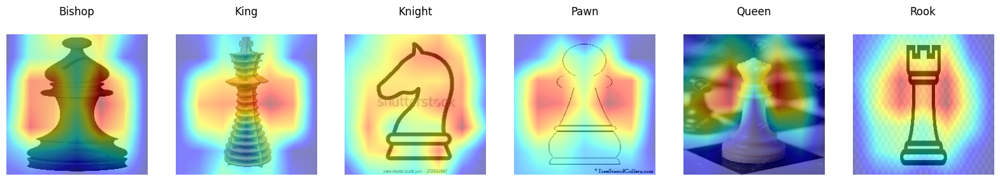

In [17]:
fig, axs = plt.subplots(1, len(LABEL_NAMES), figsize=(20, 20))

for label_idx, label_name in enumerate(label_decoder):
    axs[label_idx].set_title(label_name, loc='center', y=1.1)
    
    j = 0
    for i in range(len(test_paths)):
        j = 0
        if(test_labels[i] == label_idx):
            if(label_idx != pred[i]):
                img = open_image(test_paths[i])    
                predict = model(np.expand_dims(img, axis=0))

                # Generate cam with GradCAM++
                score = CategoricalScore(np.argmax(predict))
                cam = gradcam(score, img)
                heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)

                axs[label_idx].imshow(img, vmin=0, vmax=1)
                axs[label_idx].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
                axs[label_idx].axis("off")
                break



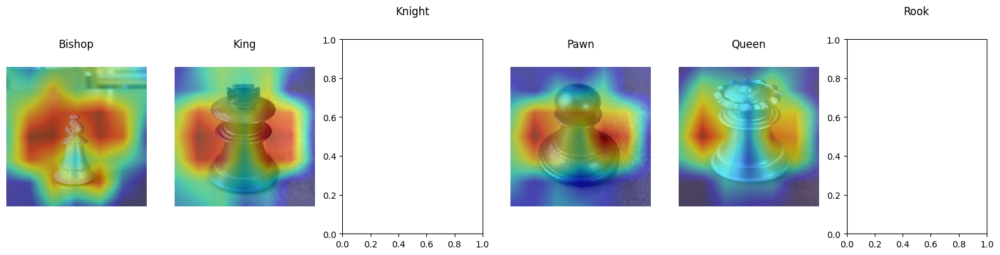

In [18]:
fig, axs = plt.subplots(1, len(LABEL_NAMES), figsize=(20, 4))

for label_idx, label_name in enumerate(label_decoder):
    axs[label_idx].set_title(label_name, loc='center', y=1.1)
    
    j = 0
    for i in range(len(verif_paths)):
        j = 0
        if(verif_labels[i] == label_idx):
            if(label_idx != verif_pred[i]):
                img = open_image(verif_paths[i])    
                predict = model(np.expand_dims(img, axis=0))

                # Generate cam with GradCAM++
                score = CategoricalScore(np.argmax(predict))
                cam = gradcam(score, img)
                heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)

                axs[label_idx].imshow(img, vmin=0, vmax=1)
                axs[label_idx].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
                axs[label_idx].axis("off")
                break

In [19]:
import tensorflow as tf
from tflite_support.metadata_writers import image_classifier
from tflite_support.metadata_writers import writer_utils

# Task Library expects label files that are in the same format as the one below.
LABEL_FILE = "labels.txt"
SAVE_TO_PATH = "MyModel.tflite"


# Create the labels file
with open(LABEL_FILE, 'w') as label_file:
    for label in label_decoder: # /!\ class_names variable must contains the names of the labels you have.
        label_file.write("{}\n".format(label))

tflite_model = tf.lite.TFLiteConverter.from_keras_model(model).convert()

# Save the model.
with open(SAVE_TO_PATH, 'wb') as f:
    f.write(tflite_model)
   
ImageClassifierWriter = image_classifier.MetadataWriter

# Normalization parameters is required when reprocessing the image. It is
# optional if the image pixel values are in range of [0, 255] and the input
# tensor is quantized to uint8. See the introduction for normalization and
# quantization parameters below for more details.
# https://www.tensorflow.org/lite/convert/metadata#normalization_and_quantization_parameters)
INPUT_NORM_MEAN = 127.5
INPUT_NORM_STD = 127.5

# Create the metadata writer.
writer = ImageClassifierWriter.create_for_inference(
    writer_utils.load_file(SAVE_TO_PATH),
    [INPUT_NORM_MEAN],
    [INPUT_NORM_STD],
    [LABEL_FILE]
)

# Verify the metadata generated by metadata writer.
print(writer.get_metadata_json())

# Populate the metadata into the model.
writer_utils.save_file(writer.populate(), SAVE_TO_PATH)

2023-06-18 12:12:35.599682: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'flatten_5_input' with dtype float and shape [?,7,7,1280]
	 [[{{node flatten_5_input}}]]
2023-06-18 12:12:35.621233: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,62720]
	 [[{{node inputs}}]]
2023-06-18 12:12:35.639650: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'inputs' with dtype float and shape [?,7,7,1280]
	 [[{{no

INFO:tensorflow:Assets written to: /tmp/tmpixr8t65r/assets


INFO:tensorflow:Assets written to: /tmp/tmpixr8t65r/assets
2023-06-18 12:12:50.091933: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:364] Ignored output_format.
2023-06-18 12:12:50.091967: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:367] Ignored drop_control_dependency.
2023-06-18 12:12:50.092316: I tensorflow/cc/saved_model/reader.cc:45] Reading SavedModel from: /tmp/tmpixr8t65r
2023-06-18 12:12:50.105478: I tensorflow/cc/saved_model/reader.cc:89] Reading meta graph with tags { serve }
2023-06-18 12:12:50.105508: I tensorflow/cc/saved_model/reader.cc:130] Reading SavedModel debug info (if present) from: /tmp/tmpixr8t65r
2023-06-18 12:12:50.149648: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:353] MLIR V1 optimization pass is not enabled
2023-06-18 12:12:50.168809: I tensorflow/cc/saved_model/loader.cc:231] Restoring SavedModel bundle.
2023-06-18 12:12:50.489533: I tensorflow/cc/saved_model/loader.cc:215] Running initializatio

{
  "name": "ImageClassifier",
  "description": "Identify the most prominent object in the image from a known set of categories.",
  "subgraph_metadata": [
    {
      "input_tensor_metadata": [
        {
          "name": "image",
          "description": "Input image to be classified.",
          "content": {
            "content_properties_type": "ImageProperties",
            "content_properties": {
              "color_space": "RGB"
            }
          },
          "process_units": [
            {
              "options_type": "NormalizationOptions",
              "options": {
                "mean": [
                  127.5
                ],
                "std": [
                  127.5
                ]
              }
            }
          ],
          "stats": {
            "max": [
              1.0
            ],
            "min": [
              -1.0
            ]
          }
        }
      ],
      "output_tensor_metadata": [
        {
          "name": "proba

**TODO**: now do the same than above, but with the misclassified images. You shouldn't change anything pertaining to grad-cam besides on which image and prediction you do it

**TODO**: try to determine what caused the misclassifcations and what you can do about it